In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/indian-servers-v3/sample_submission.csv
/kaggle/input/indian-servers-v3/train_data.csv
/kaggle/input/indian-servers-v3/test_data.csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
dataset=pd.read_csv('../input/indian-servers-v3/train_data.csv')

In [4]:
dataset.head()

,id,battery_power,bluetooth,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1,807,1,0.5,1,0,0,37,0.2,127,...,245,829,2319,5,4,4,0,0,0,1
1,2,1065,1,0.5,0,0,1,14,0.7,89,...,188,928,3078,10,1,18,1,0,1,2
2,3,1171,1,1.7,1,2,0,19,0.3,167,...,248,755,263,6,5,8,0,0,0,0
3,4,609,1,3.0,0,15,1,44,0.3,117,...,58,1253,2581,15,11,15,1,0,1,1
4,5,1193,1,2.3,0,7,0,20,1.0,158,...,1442,1904,1958,7,5,2,1,0,0,2


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1400 entries, 0 to 1399
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1400 non-null   int64  
 1   battery_power  1400 non-null   int64  
 2   bluetooth      1400 non-null   int64  
 3   clock_speed    1400 non-null   float64
 4   dual_sim       1400 non-null   int64  
 5   fc             1400 non-null   int64  
 6   four_g         1400 non-null   int64  
 7   int_memory     1400 non-null   int64  
 8   m_dep          1400 non-null   float64
 9   mobile_wt      1400 non-null   int64  
 10  n_cores        1400 non-null   int64  
 11  pc             1400 non-null   int64  
 12  px_height      1400 non-null   int64  
 13  px_width       1400 non-null   int64  
 14  ram            1400 non-null   int64  
 15  sc_h           1400 non-null   int64  
 16  sc_w           1400 non-null   int64  
 17  talk_time      1400 non-null   int64  
 18  three_g 

In [6]:
dataset.describe()

,id,battery_power,bluetooth,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,1400.0000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,...,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000
mean,700.5000,1237.027143,0.499286,1.526071,0.505714,4.215000,0.515714,32.147143,0.505143,140.125714,...,652.376429,1244.966429,2122.869286,12.294286,5.787143,10.972143,0.756429,0.503571,0.512143,1.500000
std,404.2895,440.555073,0.500178,0.824300,0.500146,4.251417,0.499932,18.209559,0.290107,35.361221,...,447.273563,428.168423,1087.155644,4.160191,4.376048,5.546213,0.429390,0.500166,0.500031,1.118434
min,1.0000,502.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,350.7500,842.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,...,283.750000,874.000000,1205.750000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,700.5000,1222.500000,0.000000,1.500000,1.000000,3.000000,1.000000,31.000000,0.500000,141.000000,...,576.000000,1247.000000,2127.000000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1050.2500,1615.000000,1.000000,2.300000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,...,958.500000,1613.000000,3049.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1400.0000,1998.000000,1.000000,3.000000,1.000000,18.000000,1.000000,64.000000,1.000000,200.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


# Data Visualization & Analising

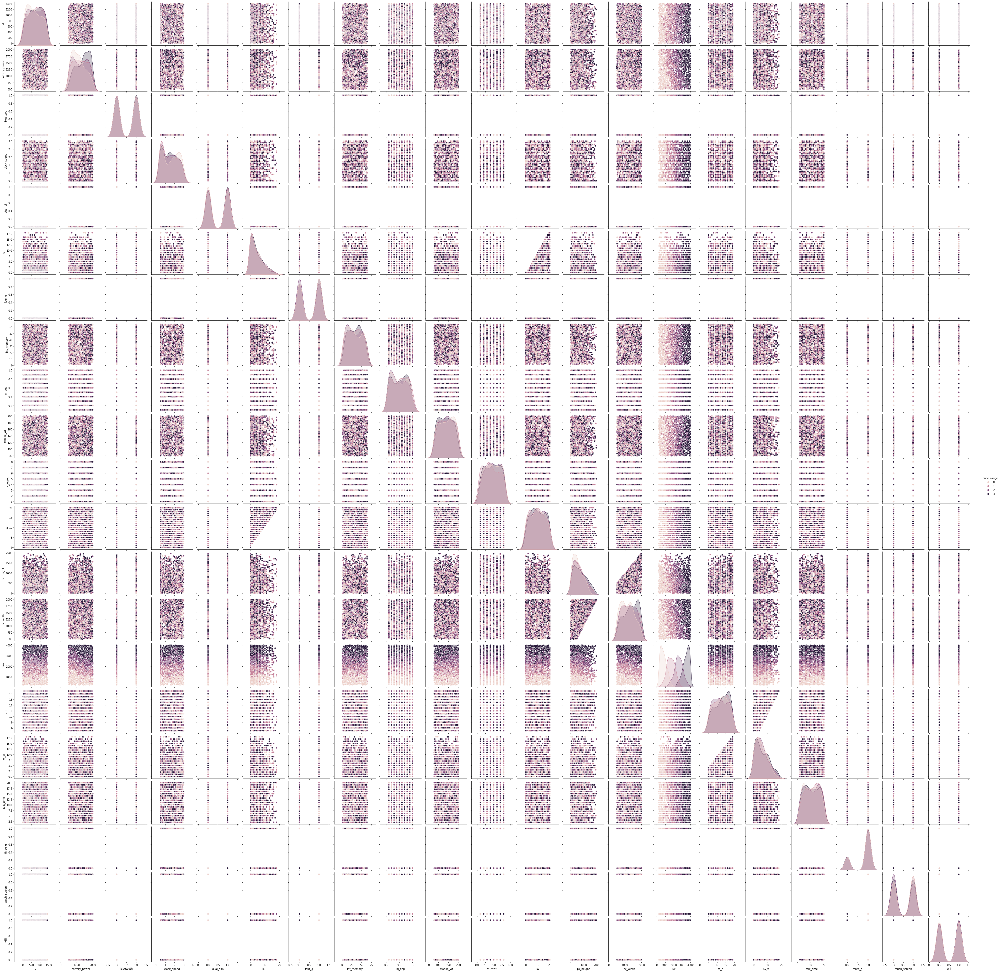

In [7]:
sns.pairplot(dataset,hue='price_range')

<AxesSubplot:xlabel='price_range', ylabel='int_memory'>

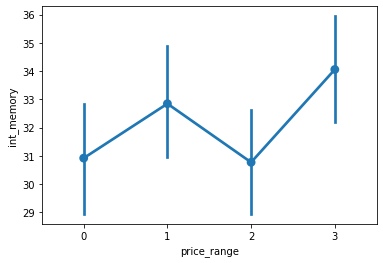

In [8]:
sns.pointplot(y="int_memory", x="price_range", data=dataset)

# Mobiles which supports 3G

In [9]:
labels = ["3G-supported",'Not supported']
values=dataset['three_g'].value_counts().values

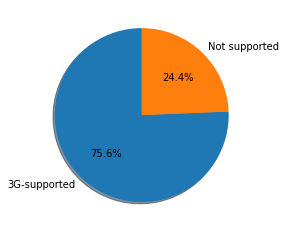

In [10]:
fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

# Mobles which Supports 4G

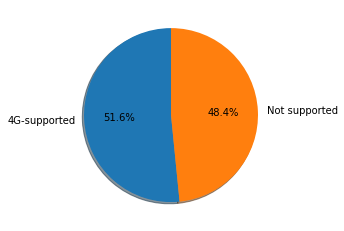

In [11]:
labels4g = ["4G-supported",'Not supported']
values4g = dataset['four_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values4g, labels=labels4g, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

# Battery Power Vs Price Range

<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

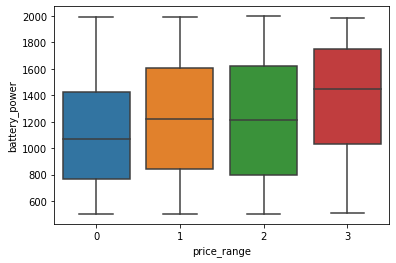

In [12]:
sns.boxplot(x="price_range", y="battery_power", data=dataset)

# Mobile Weght vs Price range

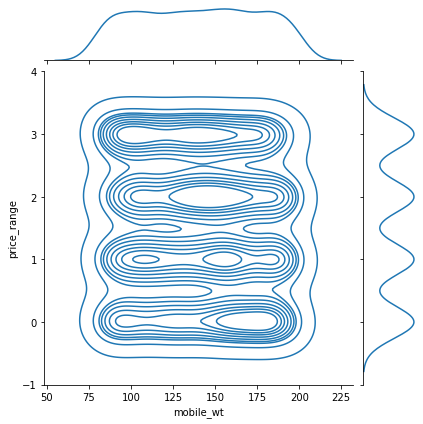

In [13]:
sns.jointplot(x='mobile_wt',y='price_range',data=dataset,kind='kde');

In [14]:
X=dataset.drop('price_range',axis=1)

In [15]:
y=dataset['price_range']

# Splitting the Data

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

# Creating & Training Linear Regression Model

In [18]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()

In [19]:
lm.fit(X_train,y_train)

LinearRegression()

In [20]:
lm.score(X_test,y_test)

0.9201913875619514

# Creating and Training KNN model

In [21]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=10)

In [22]:
knn.score(X_test,y_test)

0.8809523809523809

# Creating & Training Logistic Regression Model

In [23]:
from sklearn.linear_model import LogisticRegression
logmodel = LogisticRegression()

In [24]:
logmodel.fit(X_train,y_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression()

In [25]:
logmodel.score(X_test,y_test)

0.6385281385281385

In [26]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()

In [27]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [28]:
dtree.score(X_test,y_test)

0.7965367965367965

# Creating & Training Random Tree Model

In [29]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200)

In [30]:
rfc.score(X_test,y_test)

0.8614718614718615

# Conclusion: KNN & Linear Regression performed the best

## RESULT : Linear Regression

In [31]:
y_pred=lm.predict(X_test)

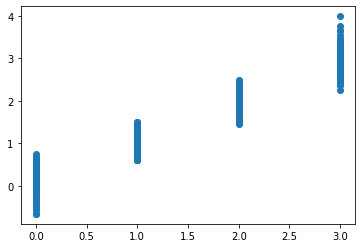

In [32]:
plt.scatter(y_test,y_pred)

In [33]:
from sklearn.metrics import classification_report,confusion_matrix

In [34]:
pred = knn.predict(X_test)

In [35]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       123
           1       0.85      0.87      0.86       111
           2       0.80      0.86      0.83       114
           3       0.94      0.84      0.89       114

    accuracy                           0.88       462
   macro avg       0.88      0.88      0.88       462
weighted avg       0.88      0.88      0.88       462



In [36]:
matrix=confusion_matrix(y_test,pred)
print(matrix)

[[116   7   0   0]
 [  7  97   7   0]
 [  0  10  98   6]
 [  0   0  18  96]]


<AxesSubplot:>

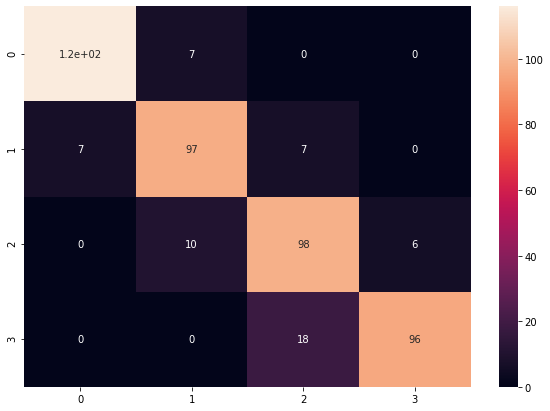

In [37]:
plt.figure(figsize = (10,7))
sns.heatmap(matrix,annot=True)

# Price prediction of Test.csv Using KNN for Prediction

In [38]:
data_test=pd.read_csv('../input/indian-servers-v3/test_data.csv')

In [39]:
data_test.head()

,id,battery_power,bluetooth,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1401,1572,1,0.8,1,7,1,8,0.8,169,...,8,577,1237,3461,6,3,10,1,1,1
1,1402,707,0,2.1,1,2,0,25,0.8,131,...,17,495,574,3838,9,2,7,1,0,1
2,1403,983,0,0.6,1,0,1,45,0.1,130,...,11,948,1205,2052,5,3,6,1,0,1
3,1404,827,1,0.6,1,9,1,35,0.2,87,...,17,23,826,2367,5,3,15,1,0,1
4,1405,1975,1,1.9,1,2,0,31,0.9,151,...,17,775,1607,3022,13,5,19,0,0,1


In [40]:
data_test=data_test.drop('id',axis=1)

In [41]:
data_test.head()

,battery_power,bluetooth,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1572,1,0.8,1,7,1,8,0.8,169,5,8,577,1237,3461,6,3,10,1,1,1
1,707,0,2.1,1,2,0,25,0.8,131,3,17,495,574,3838,9,2,7,1,0,1
2,983,0,0.6,1,0,1,45,0.1,130,4,11,948,1205,2052,5,3,6,1,0,1
3,827,1,0.6,1,9,1,35,0.2,87,6,17,23,826,2367,5,3,15,1,0,1
4,1975,1,1.9,1,2,0,31,0.9,151,1,17,775,1607,3022,13,5,19,0,0,1


# My Predicted MOdel

In [42]:
data_tests=pd.read_csv('../input/indian-servers-v3/test_data.csv')

In [43]:
data_tests.head()

,id,battery_power,bluetooth,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1401,1572,1,0.8,1,7,1,8,0.8,169,...,8,577,1237,3461,6,3,10,1,1,1
1,1402,707,0,2.1,1,2,0,25,0.8,131,...,17,495,574,3838,9,2,7,1,0,1
2,1403,983,0,0.6,1,0,1,45,0.1,130,...,11,948,1205,2052,5,3,6,1,0,1
3,1404,827,1,0.6,1,9,1,35,0.2,87,...,17,23,826,2367,5,3,15,1,0,1
4,1405,1975,1,1.9,1,2,0,31,0.9,151,...,17,775,1607,3022,13,5,19,0,0,1


In [44]:
predicted_price=knn.predict(data_tests)

In [45]:
predicted_price

array([3, 3, 1, 1, 3, 2, 0, 0, 2, 3, 1, 1, 0, 1, 0, 2, 3, 1, 3, 2, 3, 2,
       2, 0, 3, 2, 1, 3, 2, 3, 2, 2, 0, 2, 1, 2, 2, 1, 2, 2, 3, 1, 2, 3,
       0, 2, 3, 3, 1, 3, 1, 0, 0, 2, 0, 2, 1, 2, 2, 3, 3, 1, 1, 3, 2, 2,
       2, 2, 0, 0, 0, 0, 0, 3, 3, 0, 1, 1, 0, 2, 1, 2, 1, 3, 0, 2, 0, 2,
       3, 2, 1, 2, 0, 3, 3, 3, 3, 3, 0, 0, 1, 0, 1, 1, 1, 3, 1, 2, 3, 2,
       0, 1, 0, 2, 1, 3, 1, 0, 3, 1, 2, 1, 1, 0, 1, 1, 1, 3, 0, 0, 3, 2,
       0, 0, 0, 0, 1, 2, 1, 2, 2, 0, 2, 0, 2, 3, 0, 3, 2, 0, 3, 1, 2, 3,
       1, 1, 0, 3, 1, 2, 3, 1, 0, 3, 0, 0, 3, 1, 0, 2, 2, 2, 0, 1, 1, 2,
       0, 1, 2, 1, 3, 1, 1, 3, 2, 2, 0, 3, 3, 1, 0, 2, 2, 0, 3, 2, 0, 1,
       2, 3, 0, 1, 1, 2, 3, 0, 2, 2, 0, 2, 3, 0, 2, 3, 1, 1, 2, 1, 2, 2,
       3, 0, 2, 2, 2, 1, 2, 3, 0, 2, 1, 0, 2, 2, 3, 1, 3, 0, 1, 3, 1, 2,
       0, 1, 3, 0, 0, 2, 3, 0, 3, 0, 2, 0, 2, 3, 3, 1, 1, 2, 1, 0, 2, 0,
       3, 2, 2, 2, 2, 2, 1, 3, 3, 1, 0, 3, 0, 2, 1, 2, 2, 1, 1, 3, 3, 1,
       1, 2, 2, 2, 2, 1, 1, 2, 1, 0, 1, 0, 0, 0, 2,

In [46]:
data_tests['id']

0      1401
1      1402
2      1403
3      1404
4      1405
       ... 
595    1996
596    1997
597    1998
598    1999
599    2000
Name: id, Length: 600, dtype: int64

In [47]:
sub = pd.read_csv('../input/indian-servers-v3/sample_submission.csv')

In [48]:
sub.head()

,id,price_range
0,1401,0
1,1402,2
2,1403,1
3,1404,1
4,1405,3


In [49]:
sub['price_range']=predicted_price

In [50]:
sub.head()

,id,price_range
0,1401,3
1,1402,3
2,1403,1
3,1404,1
4,1405,3


In [51]:
sub

,id,price_range
0,1401,3
1,1402,3
2,1403,1
3,1404,1
4,1405,3
...,...,...
595,1996,2
596,1997,3
597,1998,0
598,1999,0


In [52]:
sub.to_csv('./result.csv')

In [53]:
result = pd.read_csv('./result.csv')

In [54]:
result.head()

,Unnamed: 0,id,price_range
0,0,1401,3
1,1,1402,3
2,2,1403,1
3,3,1404,1
4,4,1405,3


In [55]:
result = result.drop('Unnamed: 0',axis=1)

In [56]:
result.columns

Index(['id', 'price_range'], dtype='object')